<a href="https://colab.research.google.com/github/JiaminXu1019/BoundaryAttack/blob/master/ECGDataBoundaryAttack.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Boundary Attack on the ECG Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Drive
%cd
%cd /content/drive/My Drive/boundary attack v1

/root
/content/drive/My Drive/boundary attack v1


In [ ]:
!python attack.py --input_dir ./ECG_Proc_D/ecg_data_adv/PairedData/ECG8/ --store_dir ./results/ECG8/ --net ./CopyOfEcg.hdf5 --max_queries 150000


In [ ]:
from tensorflow.keras.models import load_model
model = load_model("/content/drive/My Drive/boundary attack v1/CopyOfEcg.hdf5")

Source class: 0 Target class: 1


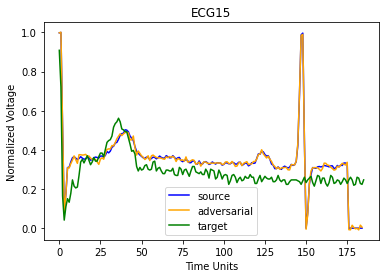

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
orig8 = np.load("/content/drive/My Drive/boundary attack v1/results/ECG15/orig.npy")
adv8 = np.load("/content/drive/My Drive/boundary attack v1/results/ECG15/adv.npy")
tgt8 = np.load("/content/drive/My Drive/boundary attack v1/ECG_Proc_D/ecg_data_adv/PairedData/ECG15/ECG_target1.npy")
o8 = model.predict(orig8).argmax()
tgt8 = np.expand_dims(tgt8[:-1,:],axis=0)
a8 = model.predict(tgt8).argmax()
print("Source class: {}".format(o8), "Target class: {}".format(a8))
plt.xlabel("Time Units")
plt.ylabel("Normalized Voltage")
plt.title("ECG15")
plt.plot(np.squeeze(orig8[:,:-1,:]), label = "source", color = "blue")
plt.plot(np.squeeze(adv8[:,:-1,:]), label = "adversarial", color = "orange")
plt.plot(np.squeeze(tgt8), label = "target", color = "green")

plt.legend()
plt.show()

[0.9165 1.609  2.016  2.303  2.525  2.709  2.861  2.996  3.113  3.219
 3.314  3.4    3.48   3.555  3.625  3.69   3.75   3.807  3.861  3.912
 3.96   4.008  4.05   4.094  4.137  4.176  4.21   4.25   4.285  4.316
 4.35   4.383  4.414  4.44   4.473  4.5    4.527  4.555  4.58   4.605
 4.63   4.652  4.676  4.7    4.723  4.746  4.766  4.79   4.81   4.83
 4.848  4.867  4.887  4.906  4.92   4.94   4.96   4.977  4.992  5.01
 5.027  5.043  5.06   5.074  5.09   5.105  5.12   5.137  5.152  5.164
 5.18   5.19   5.207  5.22   5.234  5.246  5.26   5.273  5.285  5.297
 5.312  5.324  5.336  5.348  5.36   5.37   5.383  5.395  5.406 ]


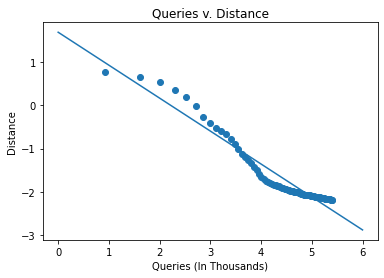

Model slope:     -0.7581853
Model intercept: 1.6769793


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

p = np.load("/content/drive/My Drive/boundary attack v1/results/ECG10/query_dist.npy")

x = np.log(p[0][1:])
y = np.log(p[1][1:])
print(x)
from sklearn.linear_model import LinearRegression
model = LinearRegression(fit_intercept=True)
model.fit(x[:, np.newaxis], y)

xfit = np.linspace(0,6)
yfit = model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)

plt.plot(xfit, yfit);

plt.xlabel("Queries (In Thousands)")
plt.ylabel("Distance")
plt.title("Queries v. Distance")
plt.plot()
plt.show()

print("Model slope:    ", model.coef_[0])
print("Model intercept:", model.intercept_)

#logy = 1.097355* logx + 6.806283
# y= 6401518.42757916 * x ^(-1.097355)


# Likely not needed

[0.9165 1.609  2.016  2.303  2.525  2.709  2.861  2.996  3.113  3.219
 3.314  3.4    3.48   3.555  3.625  3.69   3.75   3.807  3.861  3.912
 3.96   4.008  4.05   4.094  4.137  4.176  4.21   4.25   4.285  4.316
 4.35   4.383  4.414  4.44   4.473  4.5    4.527  4.555  4.58   4.605
 4.63   4.652  4.676  4.7    4.723  4.746  4.766  4.79   4.81   4.83
 4.848  4.867  4.887  4.906  4.92   4.94   4.96   4.977  4.992  5.01
 5.027  5.043  5.06   5.074  5.09   5.105  5.12   5.137  5.152  5.164
 5.18   5.19   5.207  5.22   5.234  5.246  5.26  ]


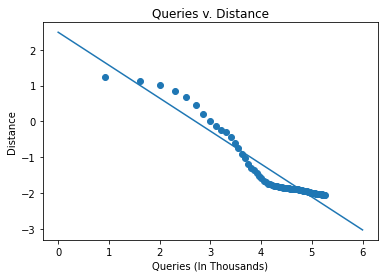

Model slope:     -0.920084
Model intercept: 2.4883301


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

p = np.load("/content/drive/My Drive/boundary attack v1/results/ECG8/query_dist.npy")

x = np.log(p[0][1:])
y = np.log(p[1][1:])
print(x)
from sklearn.linear_model import LinearRegression
model = LinearRegression(fit_intercept=True)
model.fit(x[:, np.newaxis], y)

xfit = np.linspace(0,6)
yfit = model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)

plt.plot(xfit, yfit);

plt.xlabel("Queries (In Thousands)")
plt.ylabel("Distance")
plt.title("Queries v. Distance")
plt.plot()
plt.show()

print("Model slope:    ", model.coef_[0])
print("Model intercept:", model.intercept_)

Streaming output truncated to the last 5000 lines.
Step 1634: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1635: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1636: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1637: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1638: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1639: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1640: 4.47644e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1641: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (2.9843e-03)
Step 1642: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1643: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1644: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1645: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1646: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1647: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1648: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1649: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1650: 4.44659e-01, stepsizes = 5.1e-02/6.7e-03:

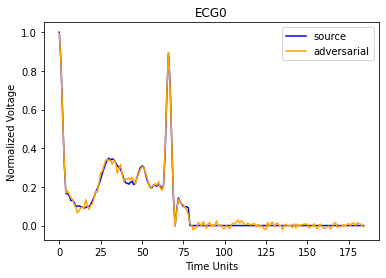

Streaming output truncated to the last 5000 lines.
Step 1626: 9.32741e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1627: 9.32741e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1628: 9.32741e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1629: 9.32741e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1630: 9.32741e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1631: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (6.2183e-03)
Step 1632: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1633: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1634: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1635: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1636: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1637: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1638: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1639: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1640: 9.26523e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1641: 9.20346e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (6.1768e-03)
Step 1642: 9.20346e

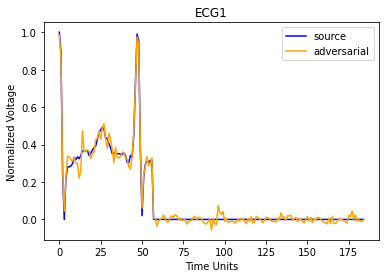

Streaming output truncated to the last 5000 lines.
Step 1635: 2.65023e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1636: 2.65023e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1637: 2.65023e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1638: 2.65023e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1639: 2.65023e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1640: 2.65023e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1641: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (1.7668e-03)
Step 1642: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1643: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1644: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1645: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1646: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1647: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1648: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1649: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1650: 2.63256e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1651: 2.61501e-01, stepsizes = 5.1e-02/6.7e-03:

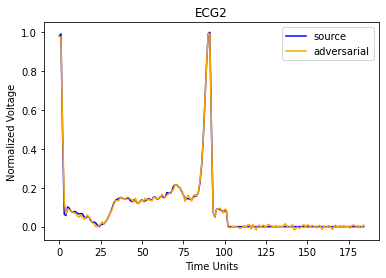

Streaming output truncated to the last 5000 lines.
Step 1630: 1.11073e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1631: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: d. reduced by 0.667% (7.4049e-03)
Step 1632: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1633: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1634: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1635: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1636: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1637: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1638: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1639: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1640: 1.10333e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1641: 1.09597e+00, stepsizes = 1.5e-02/6.7e-03: d. reduced by 0.667% (7.3555e-03)
Step 1642: 1.09597e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1643: 1.09597e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1644: 1.09597e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1645: 1.09597e+00, stepsizes = 1.5e-02/6.7e-03: 
Step 1646: 1.09597e

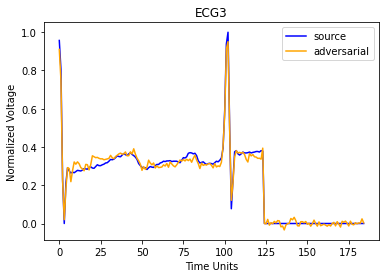

Streaming output truncated to the last 5000 lines.
Step 1626: 6.65683e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1627: 6.65683e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1628: 6.65683e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1629: 6.65683e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1630: 6.65683e-01, stepsizes = 5.1e-02/4.4e-03: 
  Success rate too high, increasing source step: spherical 0.50 (100), source 0.53 (30)
Step 1631: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.444% (2.9586e-03)
Step 1632: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1633: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1634: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1635: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1636: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1637: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1638: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1639: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1640: 6.62724e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1641: 6.58306

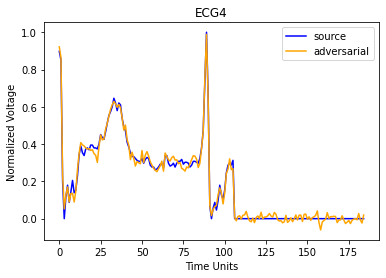

Streaming output truncated to the last 5000 lines.
Step 1626: 1.08385e+00, stepsizes = 3.4e-02/4.4e-03: 
Step 1627: 1.08385e+00, stepsizes = 3.4e-02/4.4e-03: 
Step 1628: 1.08385e+00, stepsizes = 3.4e-02/4.4e-03: 
Step 1629: 1.08385e+00, stepsizes = 3.4e-02/4.4e-03: 
Step 1630: 1.08385e+00, stepsizes = 3.4e-02/4.4e-03: 
  Boundary too linear, increasing steps:	 spherical 0.51 (100), source 0.71 (14)
Step 1631: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.444% (4.8171e-03)
Step 1632: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1633: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1634: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1635: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1636: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1637: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1638: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1639: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1640: 1.07904e+00, stepsizes = 5.1e-02/6.7e-03: 
Step 1641: 1.07184e+00, s

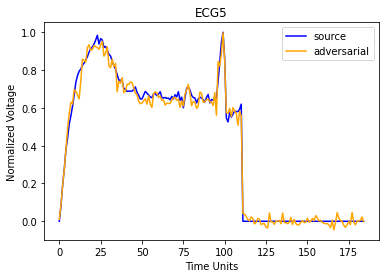

Streaming output truncated to the last 5000 lines.
Step 787: 1.23415e+00, stepsizes = 1.5e-02/1.5e-02: 
Step 788: 1.23415e+00, stepsizes = 1.5e-02/1.5e-02: 
Step 789: 1.23415e+00, stepsizes = 1.5e-02/1.5e-02: 
Step 790: 1.23415e+00, stepsizes = 1.5e-02/1.5e-02: 
  Success rate too low, decreasing source step:  spherical 0.61 ( 95), source 0.03 (30)
Step 791: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 792: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 793: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 794: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 795: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 796: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 797: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 798: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 799: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
Step 800: 1.23415e+00, stepsizes = 1.5e-02/1.0e-02: 
  Boundary too linear, increasing steps:	 spherical 0.63 (100), source 0.11 ( 9)
Step 801: 1.22181e+00, stepsizes = 2.2

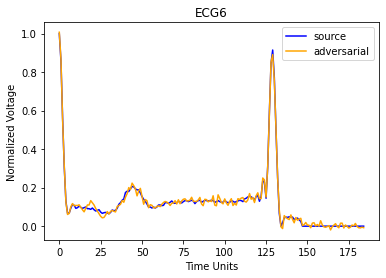

Streaming output truncated to the last 5000 lines.
Step 1625: 6.54387e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1626: 6.54387e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1627: 6.54387e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1628: 6.54387e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1629: 6.54387e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1630: 6.54387e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1631: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: d. reduced by 1.500% (9.8158e-03)
Step 1632: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1633: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1634: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1635: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1636: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1637: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1638: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1639: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1640: 6.44571e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1641: 6.34903e-01, stepsizes = 5.1e-02/1.5e-02:

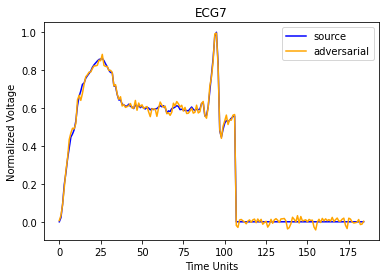

Streaming output truncated to the last 5000 lines.
Step 1628: 4.24541e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1629: 4.24541e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1630: 4.24541e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1631: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: d. reduced by 1.500% (6.3681e-03)
Step 1632: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1633: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1634: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1635: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1636: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1637: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1638: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1639: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1640: 4.18173e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1641: 4.11901e-01, stepsizes = 5.1e-02/1.5e-02: d. reduced by 1.500% (6.2726e-03)
Step 1642: 4.11901e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1643: 4.11901e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1644: 4.11901e

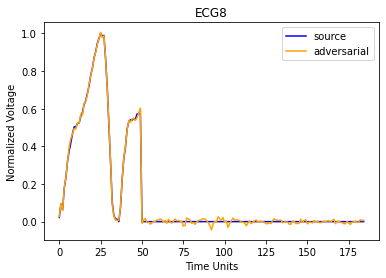

Streaming output truncated to the last 5000 lines.
Step 1628: 5.42029e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1629: 5.42029e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1630: 5.42029e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1631: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (5.4203e-03)
Step 1632: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1633: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1634: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1635: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1636: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1637: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1638: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1639: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1640: 5.36608e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1641: 5.31242e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (5.3661e-03)
Step 1642: 5.31242e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1643: 5.31242e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1644: 5.31242e

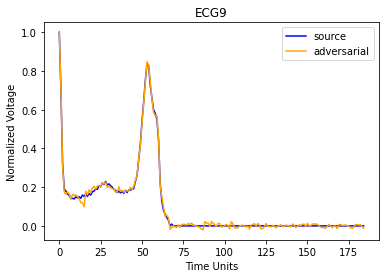

Streaming output truncated to the last 5000 lines.
Step 1636: 3.31074e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1637: 3.31074e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1638: 3.31074e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1639: 3.31074e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1640: 3.31074e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1641: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (3.3107e-03)
Step 1642: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1643: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1644: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1645: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1646: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1647: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1648: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1649: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1650: 3.27763e-01, stepsizes = 5.1e-02/1.0e-02: 
  Success rate too low, decreasing source step:  spherical 0.37 ( 59), source 0.17 (30)
Step 1651: 3.24485

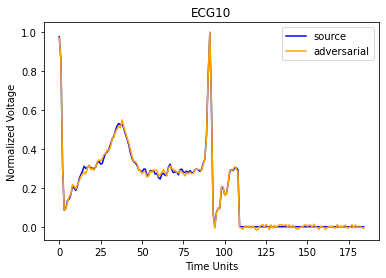

Streaming output truncated to the last 5000 lines.
Step 1639: 3.76544e-01, stepsizes = 5.1e-02/1.5e-02: 
Step 1640: 3.76544e-01, stepsizes = 5.1e-02/1.5e-02: 
  Boundary too linear, increasing steps:	 spherical 0.63 (100), source 0.07 (30)
  Success rate too low, decreasing source step:  spherical 0.63 (100), source 0.07 (30)
Step 1641: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: d. reduced by 1.500% (5.6482e-03)
Step 1642: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1643: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1644: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1645: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1646: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1647: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1648: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1649: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1650: 3.70896e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1651: 3.65333e-01, stepsizes = 7.6e-02/1.5e-02: d. reduced by 1.500% (5.5634e-03)
Step 1652: 3

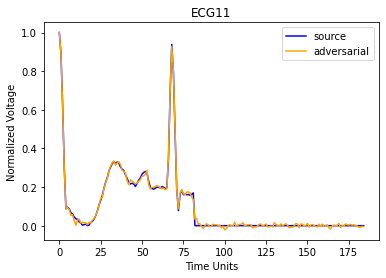

Streaming output truncated to the last 5000 lines.
Step 1631: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: d. reduced by 2.250% (9.4301e-03)
Step 1632: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1633: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1634: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1635: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1636: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1637: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1638: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1639: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1640: 4.09684e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1641: 4.00466e-01, stepsizes = 7.6e-02/2.2e-02: d. reduced by 2.250% (9.2179e-03)
Step 1642: 4.00466e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1643: 4.00466e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1644: 4.00466e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1645: 4.00466e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1646: 4.00466e-01, stepsizes = 7.6e-02/2.2e-02: 
Step 1647: 4.00466e

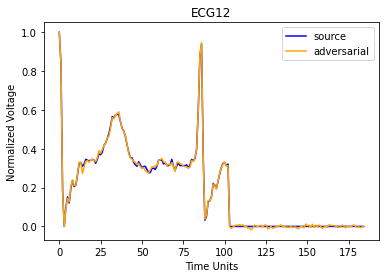

Streaming output truncated to the last 5000 lines.
Step 1322: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1323: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1324: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1325: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1326: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1327: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1328: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1329: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1330: 8.13984e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1331: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: d. reduced by 1.000% (8.1398e-03)
Step 1332: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1333: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1334: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1335: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1336: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1337: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1338: 8.05844e-01, stepsizes = 3.4e-02/1.0e-02:

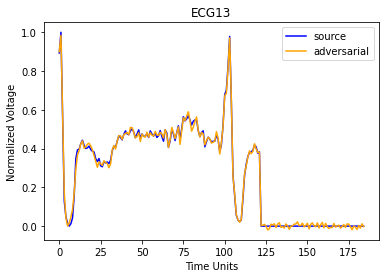

Streaming output truncated to the last 5000 lines.
Step 1624: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1625: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1626: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1627: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1628: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1629: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1630: 3.53520e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1631: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (3.5352e-03)
Step 1632: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1633: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1634: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1635: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1636: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1637: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1638: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1639: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1640: 3.49985e-01, stepsizes = 5.1e-02/1.0e-02:

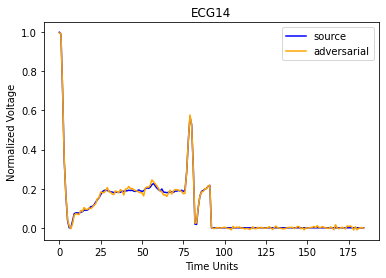

Streaming output truncated to the last 5000 lines.
Step 1628: 3.76851e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1629: 3.76851e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1630: 3.76851e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1631: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: d. reduced by 1.000% (3.7685e-03)
Step 1632: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1633: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1634: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1635: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1636: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1637: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1638: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1639: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1640: 3.73083e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1641: 3.69352e-01, stepsizes = 7.6e-02/1.0e-02: d. reduced by 1.000% (3.7308e-03)
Step 1642: 3.69352e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1643: 3.69352e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1644: 3.69352e

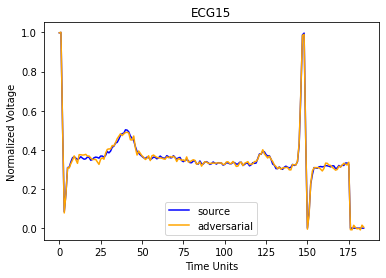

Streaming output truncated to the last 5000 lines.
Step 1637: 4.70024e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1638: 4.70024e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1639: 4.70024e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1640: 4.70024e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1641: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: d. reduced by 0.444% (2.0890e-03)
Step 1642: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1643: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1644: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1645: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1646: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1647: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1648: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1649: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1650: 4.67935e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1651: 4.65855e-01, stepsizes = 5.1e-02/4.4e-03: d. reduced by 0.444% (2.0797e-03)
Step 1652: 4.65855e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1653: 4.65855e

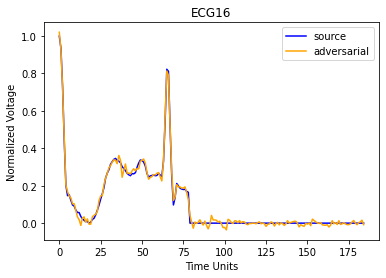

Streaming output truncated to the last 5000 lines.
Step 1639: 8.19476e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1640: 8.19476e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1641: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (8.1948e-03)
Step 1642: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1643: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1644: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1645: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1646: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1647: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1648: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1649: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1650: 8.11281e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1651: 8.03168e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (8.1128e-03)
Step 1652: 8.03168e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1653: 8.03168e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1654: 8.03168e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1655: 8.03168e

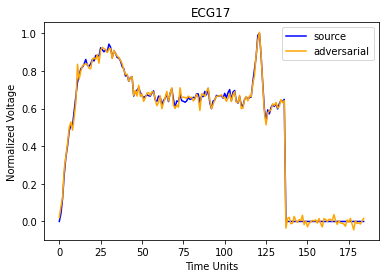

Streaming output truncated to the last 5000 lines.
Step 1624: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1625: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1626: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1627: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1628: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1629: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1630: 6.08261e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1631: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (4.0551e-03)
Step 1632: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1633: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1634: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1635: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1636: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1637: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1638: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1639: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1640: 6.04206e-01, stepsizes = 5.1e-02/6.7e-03:

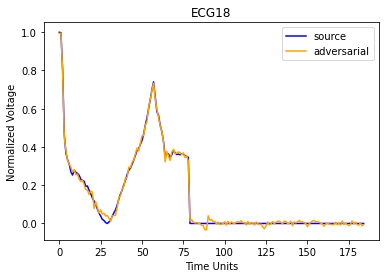

Streaming output truncated to the last 5000 lines.
Step 1142: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1143: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1144: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1145: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1146: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1147: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1148: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1149: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1150: 6.14693e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1151: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: d. reduced by 1.000% (6.1469e-03)
Step 1152: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1153: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1154: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1155: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1156: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1157: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1158: 6.08546e-01, stepsizes = 3.4e-02/1.0e-02:

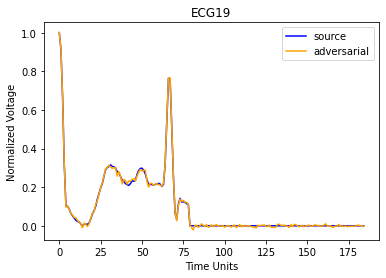

Streaming output truncated to the last 5000 lines.
Step 1628: 8.11918e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1629: 8.11918e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1630: 8.11918e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1631: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (8.1192e-03)
Step 1632: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1633: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1634: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1635: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1636: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1637: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1638: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1639: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1640: 8.03799e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1641: 7.95761e-01, stepsizes = 5.1e-02/1.0e-02: d. reduced by 1.000% (8.0380e-03)
Step 1642: 7.95761e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1643: 7.95761e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1644: 7.95761e

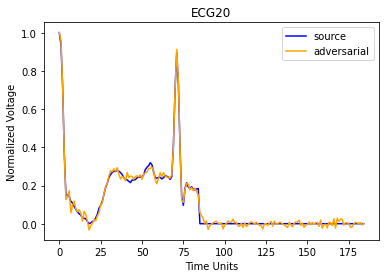

Streaming output truncated to the last 5000 lines.
Step 1628: 6.63856e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1629: 6.63856e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1630: 6.63856e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1631: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: d. reduced by 0.444% (2.9505e-03)
Step 1632: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1633: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1634: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1635: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1636: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1637: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1638: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1639: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1640: 6.60906e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1641: 6.57968e-01, stepsizes = 2.2e-02/4.4e-03: d. reduced by 0.444% (2.9374e-03)
Step 1642: 6.57968e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1643: 6.57968e-01, stepsizes = 2.2e-02/4.4e-03: 
Step 1644: 6.57968e

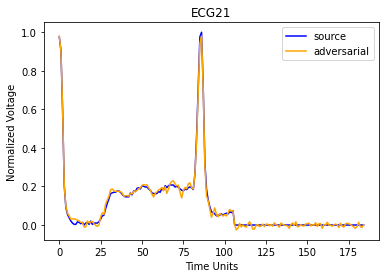

Streaming output truncated to the last 5000 lines.
Step 1641: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: d. reduced by 0.198% (3.0921e-03)
Step 1642: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1643: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1644: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1645: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1646: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1647: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1648: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1649: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1650: 1.56228e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1651: 1.55919e+00, stepsizes = 1.5e-02/2.0e-03: d. reduced by 0.198% (3.0860e-03)
Step 1652: 1.55919e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1653: 1.55919e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1654: 1.55919e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1655: 1.55919e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1656: 1.55919e+00, stepsizes = 1.5e-02/2.0e-03: 
Step 1657: 1.55919e

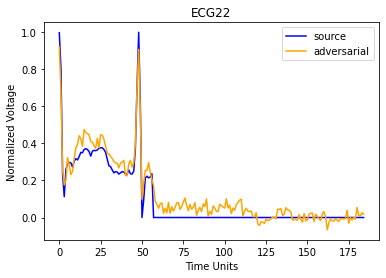

Streaming output truncated to the last 5000 lines.
Step 1639: 7.09824e-01, stepsizes = 5.1e-02/1.0e-02: 
Step 1640: 7.09824e-01, stepsizes = 5.1e-02/1.0e-02: 
  Success rate too low, decreasing source step:  spherical 0.24 ( 37), source 0.10 (30)
Step 1641: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1642: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1643: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1644: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1645: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1646: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1647: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1648: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1649: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1650: 7.09824e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1651: 7.05092e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (4.7322e-03)
Step 1652: 7.05092e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1653: 7.05092e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1654: 7.05092

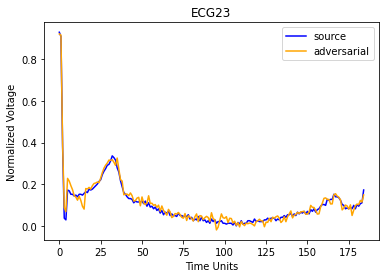

Streaming output truncated to the last 5000 lines.
Step 1633: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1634: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1635: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1636: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1637: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1638: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1639: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1640: 1.61615e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1641: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: d. reduced by 2.250% (3.6363e-03)
Step 1642: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1643: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1644: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1645: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1646: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1647: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1648: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02: 
Step 1649: 1.57979e-01, stepsizes = 5.1e-02/2.3e-02:

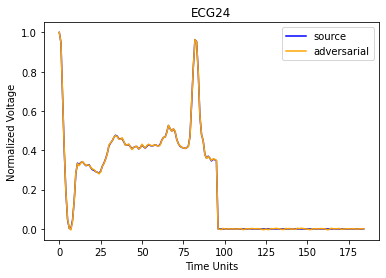

Streaming output truncated to the last 5000 lines.
Step 1628: 1.16449e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1629: 1.16449e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1630: 1.16449e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1631: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: d. reduced by 0.296% (3.4503e-03)
Step 1632: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1633: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1634: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1635: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1636: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1637: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1638: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1639: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1640: 1.16103e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1641: 1.15759e+00, stepsizes = 3.4e-02/3.0e-03: d. reduced by 0.296% (3.4401e-03)
Step 1642: 1.15759e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1643: 1.15759e+00, stepsizes = 3.4e-02/3.0e-03: 
Step 1644: 1.15759e

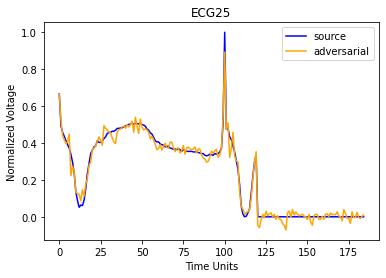

Streaming output truncated to the last 5000 lines.
Step 1632: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1633: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1634: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1635: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1636: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1637: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1638: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1639: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1640: 1.34333e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1641: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: d. reduced by 0.198% (2.6535e-03)
Step 1642: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1643: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1644: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1645: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1646: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1647: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03: 
Step 1648: 1.34068e+00, stepsizes = 2.2e-02/2.0e-03:

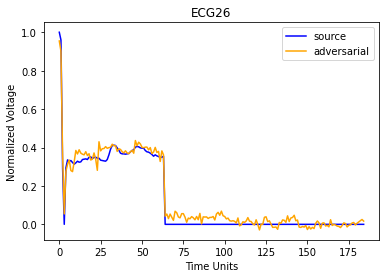

Streaming output truncated to the last 5000 lines.
Step 1630: 5.05328e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1631: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: d. reduced by 0.296% (1.4973e-03)
Step 1632: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1633: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1634: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1635: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1636: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1637: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1638: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1639: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1640: 5.03831e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1641: 5.02338e-01, stepsizes = 2.2e-02/3.0e-03: d. reduced by 0.296% (1.4928e-03)
Step 1642: 5.02338e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1643: 5.02338e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1644: 5.02338e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1645: 5.02338e-01, stepsizes = 2.2e-02/3.0e-03: 
Step 1646: 5.02338e

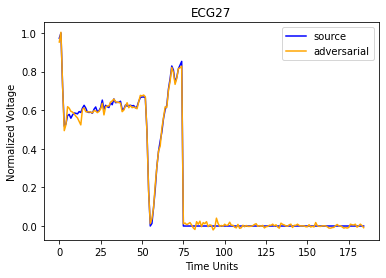

Streaming output truncated to the last 5000 lines.
Step 1627: 9.77890e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1628: 9.77890e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1629: 9.77890e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1630: 9.77890e-01, stepsizes = 5.1e-02/6.7e-03: 
  Success rate too low, decreasing source step:  spherical 0.21 (100), source 0.13 (30)
Step 1631: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: d. reduced by 0.667% (6.5193e-03)
Step 1632: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1633: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1634: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1635: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1636: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1637: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1638: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1639: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1640: 9.71371e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1641: 9.67053e-01, stepsizes = 5.1e-02/4.4e-03: d. reduced by 0.444

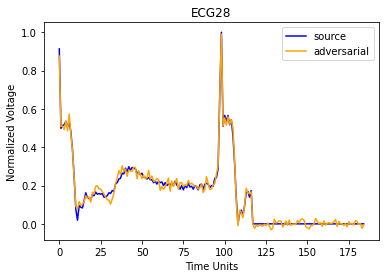

Streaming output truncated to the last 5000 lines.
Step 1402: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1403: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1404: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1405: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1406: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1407: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1408: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1409: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1410: 4.88806e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1411: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: d. reduced by 1.000% (4.8881e-03)
Step 1412: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1413: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1414: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1415: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1416: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1417: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02: 
Step 1418: 4.83918e-01, stepsizes = 3.4e-02/1.0e-02:

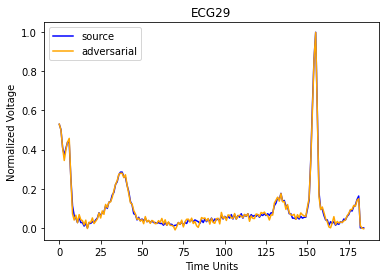

Streaming output truncated to the last 5000 lines.
Step 782: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 783: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 784: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 785: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 786: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 787: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 788: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 789: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 790: 1.34439e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 791: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: d. reduced by 0.667% (8.9626e-03)
Step 792: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 793: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 794: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 795: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 796: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 797: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 798: 1.33542e+00, stepsizes = 2.2e-02/6.7e-03: 
Step 799: 1.335

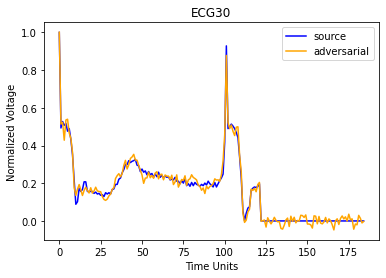

Streaming output truncated to the last 5000 lines.
Step 1635: 7.89481e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1636: 7.89481e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1637: 7.89481e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1638: 7.89481e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1639: 7.89481e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1640: 7.89481e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1641: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: d. reduced by 1.500% (1.1842e-02)
Step 1642: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1643: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1644: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1645: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1646: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1647: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1648: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1649: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1650: 7.77638e-01, stepsizes = 3.4e-02/1.5e-02: 
Step 1651: 7.65974e-01, stepsizes = 3.4e-02/1.5e-02:

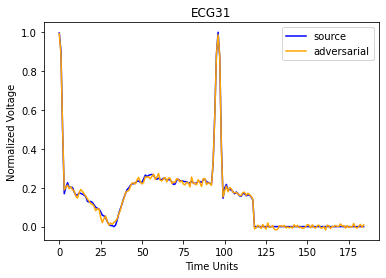

Streaming output truncated to the last 5000 lines.
Step 1632: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1633: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1634: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1635: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1636: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1637: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1638: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1639: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1640: 7.31485e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1641: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: d. reduced by 1.000% (7.3149e-03)
Step 1642: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1643: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1644: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1645: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1646: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1647: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02: 
Step 1648: 7.24171e-01, stepsizes = 7.6e-02/1.0e-02:

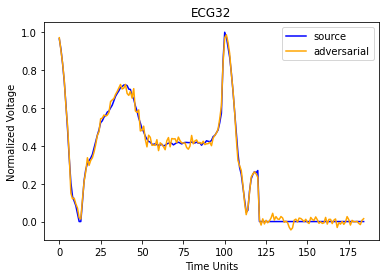

Streaming output truncated to the last 5000 lines.
Step 1639: 3.02108e-01, stepsizes = 5.1e-02/4.4e-03: 
Step 1640: 3.02108e-01, stepsizes = 5.1e-02/4.4e-03: 
  Success rate too high, increasing source step: spherical 0.58 ( 19), source 0.60 (30)
Step 1641: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.444% (1.3427e-03)
Step 1642: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1643: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1644: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1645: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1646: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1647: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1648: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1649: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1650: 3.00765e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1651: 2.98760e-01, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.667% (2.0051e-03)
Step 1652: 2.98760e-01, stepsizes = 5.1e-02/6.7e-03: 
Step 1653: 2.98760e-01, stepsizes = 5.1

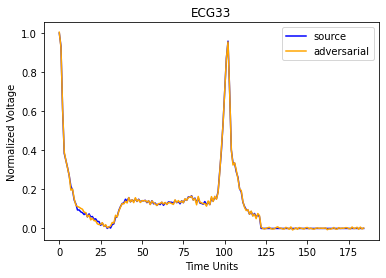

Streaming output truncated to the last 5000 lines.
Step 1630: 2.45243e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1631: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: d. reduced by 1.500% (3.6786e-03)
Step 1632: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1633: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1634: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1635: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1636: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1637: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1638: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1639: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1640: 2.41564e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1641: 2.37941e-01, stepsizes = 7.6e-02/1.5e-02: d. reduced by 1.500% (3.6235e-03)
Step 1642: 2.37941e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1643: 2.37941e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1644: 2.37941e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1645: 2.37941e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1646: 2.37941e

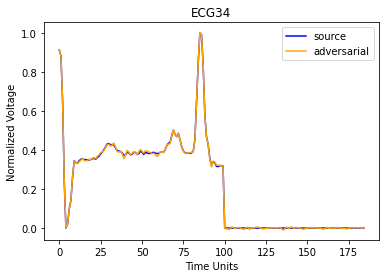

Streaming output truncated to the last 5000 lines.
Step 1644: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1645: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1646: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1647: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1648: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1649: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1650: 1.00092e+00, stepsizes = 2.2e-02/1.0e-02: 
Step 1651: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: d. reduced by 1.000% (1.0009e-02)
Step 1652: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1653: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1654: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1655: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1656: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1657: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1658: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1659: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02: 
Step 1660: 9.90912e-01, stepsizes = 2.2e-02/1.0e-02:

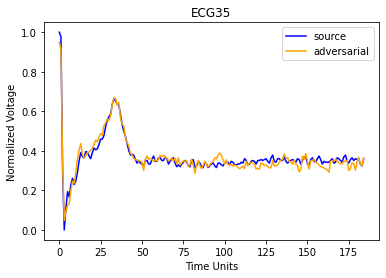

Streaming output truncated to the last 5000 lines.
Step 1631: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: d. reduced by 1.500% (1.0728e-02)
Step 1632: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1633: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1634: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1635: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1636: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1637: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1638: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1639: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1640: 7.04440e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1641: 6.93873e-01, stepsizes = 7.6e-02/1.5e-02: d. reduced by 1.500% (1.0567e-02)
Step 1642: 6.93873e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1643: 6.93873e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1644: 6.93873e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1645: 6.93873e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1646: 6.93873e-01, stepsizes = 7.6e-02/1.5e-02: 
Step 1647: 6.93873e

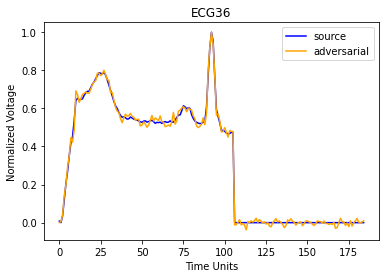

Streaming output truncated to the last 5000 lines.
Step 1630: 1.06344e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1631: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: d. reduced by 0.198% (2.1006e-03)
Step 1632: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1633: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1634: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1635: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1636: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1637: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1638: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1639: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1640: 1.06134e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1641: 1.05924e+00, stepsizes = 3.4e-02/2.0e-03: d. reduced by 0.198% (2.0965e-03)
Step 1642: 1.05924e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1643: 1.05924e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1644: 1.05924e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1645: 1.05924e+00, stepsizes = 3.4e-02/2.0e-03: 
Step 1646: 1.05924e

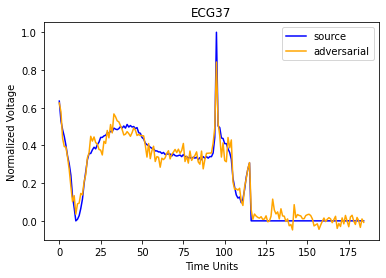

Streaming output truncated to the last 5000 lines.
Step 1633: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1634: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1635: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1636: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1637: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1638: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1639: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1640: 2.21400e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1641: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: d. reduced by 0.667% (1.4760e-02)
Step 1642: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1643: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1644: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1645: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1646: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1647: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1648: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03: 
Step 1649: 2.19924e+00, stepsizes = 3.4e-02/6.7e-03:

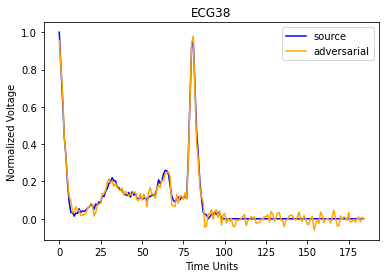

Streaming output truncated to the last 5000 lines.
Step 1629: 9.80284e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1630: 9.80284e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1631: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: d. reduced by 0.444% (4.3568e-03)
Step 1632: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1633: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1634: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1635: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1636: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1637: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1638: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1639: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1640: 9.75927e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1641: 9.71589e-01, stepsizes = 3.4e-02/4.4e-03: d. reduced by 0.444% (4.3375e-03)
Step 1642: 9.71589e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1643: 9.71589e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1644: 9.71589e-01, stepsizes = 3.4e-02/4.4e-03: 
Step 1645: 9.71589e

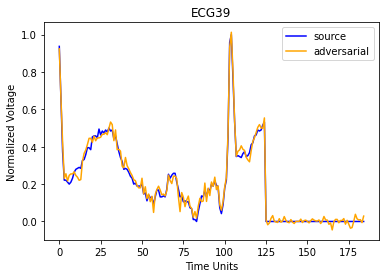

In [ ]:
# Testing Attack on All Pairs

%cd
%cd /content/drive/My Drive/boundary attack v1

from tensorflow.keras.models import load_model
model = load_model("/content/drive/My Drive/boundary attack v1/CopyOfEcg.hdf5")

for n in range(40):
  title = "ECG{}".format(n)
  !python attack.py --input_dir ./ECG_Proc_D/ecg_data_adv/PairedData/$title/ --store_dir ./results/$title/ --net ./CopyOfEcg.hdf5 --max_queries 150000 
  orig = np.load("/content/drive/My Drive/boundary attack v1/results/" + title + "/orig.npy")
  adv = np.load("/content/drive/My Drive/boundary attack v1/results/" + title + "/adv.npy")
  o = model.predict(orig).argmax()
  a = model.predict(adv).argmax()
  print("Source class: {}".format(o), "Target class: {}".format(a))
  plt.xlabel("Time Units")
  plt.ylabel("Normalized Voltage")
  plt.title(title)
  plt.plot(np.squeeze(orig[:,:-1,:]), label = "source", color = "blue")
  plt.plot(np.squeeze(adv[:,:-1,:]), label = "adversarial", color = "orange")
  plt.legend()
  plt.show()

In [ ]:
# Stats for efficiency and optimization

import numpy as np
from numpy.linalg import norm
min_iter = np.Infinity
min_query = np.Infinity
min_dist = np.Infinity
max_iter = 0
max_query = 0
max_dist = 0
agg_iter = 0
agg_query = 0
agg_dist = 0
for n in range(40):
  title = "ECG{}".format(n)
  dir = title + "/iteration_queries.npy"
  nums = np.load("/content/drive/My Drive/boundary attack v1/results/"+dir)
  iter = nums[0][0]
  query = nums[1][0]
  if iter < min_iter:
    min_iter = iter
  if iter > max_iter:
    max_iter = iter
  if query < min_query:
    min_query = query
  if query > max_query:
    max_query = query
  agg_iter += iter
  agg_query += query
  dir = title + "/orig.npy"
  orig = np.load("/content/drive/My Drive/boundary attack v1/results/"+dir)
  dir = title + "/adv.npy"
  adv = np.load("/content/drive/My Drive/boundary attack v1/results/"+dir)
  dist = norm(orig - adv)
  if dist < min_dist:
    min_dist = dist
  if dist > max_dist:
    max_dist = dist
  agg_dist += dist


print("The average number of queries was: {} thousand".format(agg_query/40))
print("The minimum number of queries was: {} thousand".format(min_query))
print("The maximum number of queries was: {} thousand".format(max_query))
print("The average number of iterations was: {}".format(agg_iter/40))
print("The minimum number of iterations was: {}".format(min_iter))
print("The maximum number of iterations was: {}".format(max_iter))
print("The average distance was: {}".format(agg_dist/40))
print("The minimum distance was: {}".format(min_dist))
print("The maximum distance was: {}".format(max_dist))



The average number of queries was: 148450.8 thousand
The minimum number of queries was: 130640 thousand
The maximum number of queries was: 150000 thousand
The average number of iterations was: 6528.45
The minimum number of iterations was: 5740
The maximum number of iterations was: 6606
The average distance was: 0.22869834899902344
The minimum distance was: 0.0269622802734375
The maximum distance was: 0.70263671875


In [ ]:
# Regression Iteration vs Distance

import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

agg_coef = 0
agg_int = 0
model = LinearRegression(fit_intercept=True)

for n in range(40):
  title = "ECG{}".format(n)
  dir = title + "/query_dist.npy"
  nums = np.load("/content/drive/My Drive/boundary attack v1/results/"+dir)

  x = np.log(nums[0][1:])
  x = np.expand_dims(x, axis = 1)
  y = np.log(nums[1][1:])

  model.fit(x, y)

  xfit = np.linspace(0,10 )
  yfit = model.predict(xfit[:, np.newaxis])
  agg_coef += model.coef_[0]
  agg_int += model.intercept_

print("The average coefficient was: {}".format(agg_coef/40))
print("The average int was: {}".format(agg_int/40))

  # logy = 1.097355 * logx + 6.806283

  # y= 187652.35441289 * x ^ (-0.78732107)
 
# x = np.linspace(0, 14000)
# y = 187652.35441289 * (x **(-0.78732107))


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in power
  del sys.path[0]


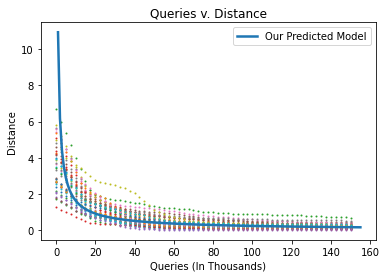

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for n in range(40):
  title = "ECG{}".format(n)
  p = np.load("/content/drive/My Drive/boundary attack v1/results/" + title + "/query_dist.npy")
  x1 = p[0]
  y1 = p[1]
  plt.scatter(x1,y1, s=1)


x = np.linspace(0,155,156)
y= (np.e ** 2.3914711117744445) * (x ** -0.8234776213765145)
 
plt.plot(x, y, linewidth=2.5, label = "Our Predicted Model")
plt.xlabel("Queries (In Thousands)")
plt.ylabel("Distance")
plt.title("Queries v. Distance")
plt.plot()
plt.legend()
plt.show()

# x = 25
#   y = (9.00015)*(x**(-1.82347))
#   print(y)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in power
  


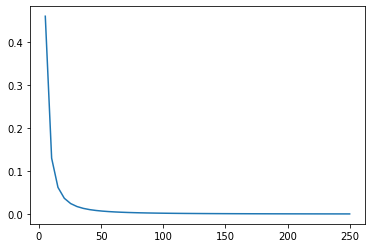

In [ ]:
x = np.linspace(0,250)
y = (9.00015)*(x**(-1.82347))

plt.plot(x, y)
plt.plot()
plt.show()

In [ ]:

x = np.linspace(0,240)
y= (np.e ** 2.3914711117744445) * (x ** -0.8234776213765145)
 
plt.plot(x, y, linewidth=2.5)
plt.show

/root
/content/drive/My Drive/boundary attack v1


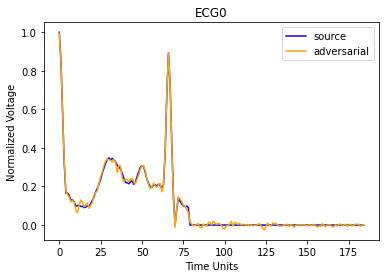

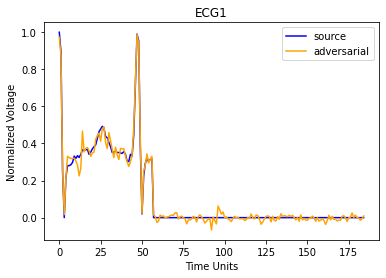

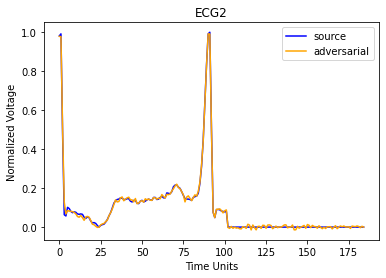

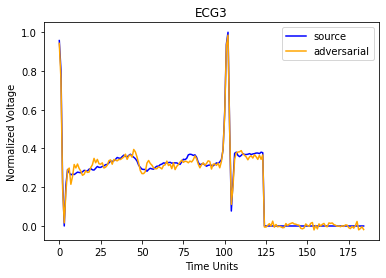

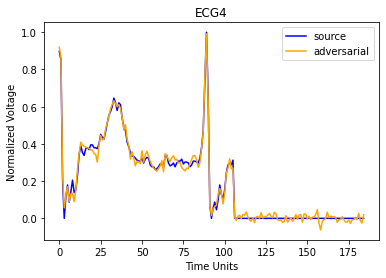

...

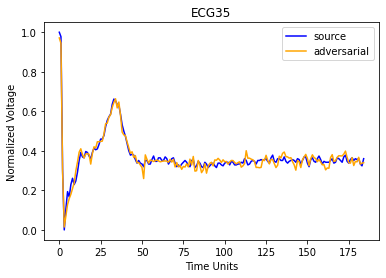

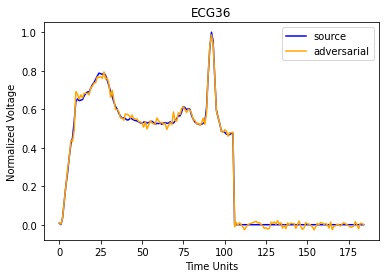

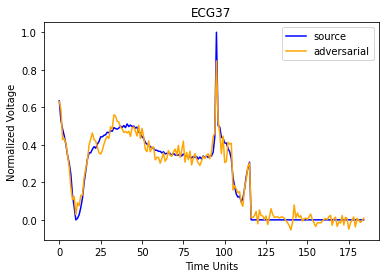

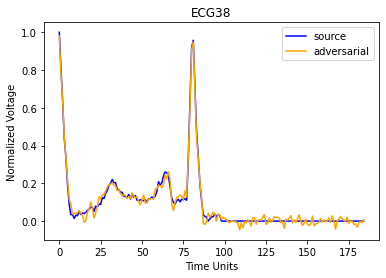

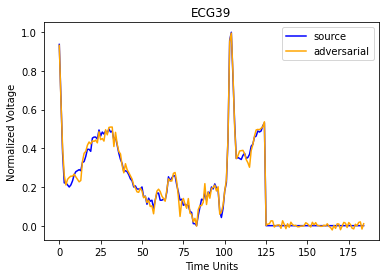

In [ ]:
# Plotting Adversarial vs Source

%cd
%cd /content/drive/My Drive/boundary attack v1

for n in range(40):
  title = "ECG{}".format(n)
  orig = np.load("/content/drive/My Drive/boundary attack v1/results/" + title + "/orig.npy")
  adv = np.load("/content/drive/My Drive/boundary attack v1/results/" + title + "/adv.npy")
  plt.xlabel("Time Units")
  plt.ylabel("Normalized Voltage")
  plt.title(title)
  plt.plot(np.squeeze(orig[:,:-1,:]), label = "source", color = "blue")
  plt.plot(np.squeeze(adv[:,:-1,:]), label = "adversarial", color = "orange")
  plt.legend()
  plt.show()

In [ ]:
a = np.linspace(-10,30)
print(a.size)

50
